# Ha jokes on you this is smaller SNR

In [30]:
# import system libraries
import logging
import sys, copy
# import scientific libraries
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import scipy.signal
from scipy.interpolate import InterpolatedUnivariateSpline as spline
import h5py
import pandas as pd
# import data analysis libraries
from ldc.waveform.lisabeta import FastBHB
import lisabeta.lisa.lisa as lisa
from lisabeta.lisa.lisa import EvaluateTDIFreqseries
import lisabeta.tools.pyspline as pyspline
import lisabeta.lisa.lisatools as lisatools
import lisabeta.tools.pytools as pytools
from ldc.common import tools
from ldc.lisa.noise import AnalyticNoise, get_noise_model
from chainconsumer import Chain, ChainConsumer, make_sample, Truth
import lisaconstants
# import sampler libraries
from eryn.ensemble import EnsembleSampler
from eryn.state import State
from eryn.prior import uniform_dist, ProbDistContainer
from ldc.waveform.waveform import HpHc
import LISA_TTL_Functions as fcn


In [31]:
filename = '/Users/corinnekomlodi/Desktop/LDC2_sangria_training_v2.h5'
catpath = 'sky/mbhb/cat'

In [113]:
pMBHB_snr_list = fcn.compute_sangria_snr(filename, catpath)
print(pMBHB_snr_list)
print(pMBHB_snr_list[7])

{0: np.float64(195.9982389760789), 1: np.float64(37.73479612767927), 2: np.float64(16.228675469768756), 3: np.float64(131.0794122510341), 4: np.float64(213.0743037905127), 5: np.float64(106.2690505063682), 6: np.float64(179.78960494756805), 7: np.float64(54.12592578184006), 8: np.float64(68.40840499764023), 9: np.float64(79.28429047190447), 10: np.float64(88.66753523333284), 11: np.float64(64.44653529760546), 12: np.float64(61.92876980325502), 13: np.float64(23.9021492459857), 14: np.float64(56.61289823743485)}
54.12592578184006


In [33]:
pMBHB_snr = fcn.sangria_source(filename, catpath, 7)

In [81]:
print(pMBHB_snr)
pMBHB_snr['EclipticLongitude'] = np.cos(pMBHB_snr['EclipticLongitude'])
print(pMBHB_snr)

{np.str_('EclipticLatitude'): np.float64(0.9170307528208983), np.str_('EclipticLongitude'): np.float64(3.5848915055548125), np.str_('PolarAngleOfSpin1'): np.float64(1.6658498049021284), np.str_('PolarAngleOfSpin2'): np.float64(2.092903155833516), np.str_('Spin1'): np.float64(0.988778), np.str_('Spin2'): np.float64(0.975945), np.str_('Mass1'): np.float64(1856420.28713), np.str_('Mass2'): np.float64(1801541.22385), np.str_('CoalescenceTime'): np.float64(16532191.547870105), np.str_('PhaseAtCoalescence'): np.float64(1.8660570584753848), np.str_('InitialPolarAngleL'): np.float64(1.4100680944990884), np.str_('InitialAzimuthalAngleL'): np.float64(0.5279147880519126), np.str_('Redshift'): np.float64(4.57261), np.str_('Distance'): np.float64(43010.925050110134), np.str_('ObservationDuration'): np.float64(31558149.763545603), np.str_('Cadence'): np.float64(3.0)}
{np.str_('EclipticLatitude'): np.float64(0.9170307528208983), np.str_('EclipticLongitude'): np.float64(-0.9033416315858802), np.str_('

In [115]:
#establish t_min, max, separation and number of samples
t_min = 0
t_max = pMBHB_snr["CoalescenceTime"]+1000
dt = 0.25
df = 1/t_max
#a constant
fstar = 0.0190854 #c/L/(2*np.pi)

t = np.arange(t_min, t_max, dt)

In [83]:
#set up the injection in lisabeta terms
FBH = FastBHB("MBHB", T=t_max, delta_t=dt, approx="IMRPhenomD")

pMBHB = FBH.rename_as_lisabeta(pMBHB_snr)

print(pMBHB.keys())
print(pMBHB.values())

dict_keys(['beta', 'lambda', 'chi1', 'chi2', 'm1', 'm2', 'Deltat', 'phi', 'dist', 'psi', 'inc'])
dict_values([np.float64(0.9170307528208983), np.float64(-0.9033416315858802), np.float64(-0.09384532089744416), np.float64(-0.486710974346455), np.float64(1856420.28713), np.float64(1801541.22385), np.float64(16532191.547870105), np.float64(1.8660570584753848), np.float64(43010.925050110134), np.float64(-3.1296719957618815), np.float64(1.7829208370729992)])


In [84]:
#background settings
waveform_params_smbh = {
    "minf": 1e-5,
    "maxf": 1,
    "t0": 0.0,
    "timetomerger_max": 1.0,
    "tmax": 1.0,
    "TDI": "TDIAET",
    "LISAconst": "Proposal",
    "responseapprox": "full",
    "frozenLISA": False,
    "TDIrescaled": False
}

Make sure we have the source in the data

In [85]:
#generate signal
tdisignal = lisa.GenerateLISATDISignal_SMBH(pMBHB, **waveform_params_smbh)
tdi = tdisignal['tdi']
mbh_lb = tdi[(2,2)]
#generate frequency grid
freq = mbh_lb['freq']
freq = freq[freq>0]
#generate data
A_full = np.conjugate((mbh_lb['amp_real_chan1'] + 1.j*mbh_lb['amp_imag_chan1'])*np.exp(1j* mbh_lb['phase']))
E_full = np.conjugate((mbh_lb['amp_real_chan2'] + 1.j*mbh_lb['amp_imag_chan2'])*np.exp(1j* mbh_lb['phase']))
#generate noise PSD
Nmodel = AnalyticNoise(freq, model="SciRDv1") # or whatever version you prefer. In the previous notebook we used "sangria"
Npsd = Nmodel.psd(option='A', tdi2=True)

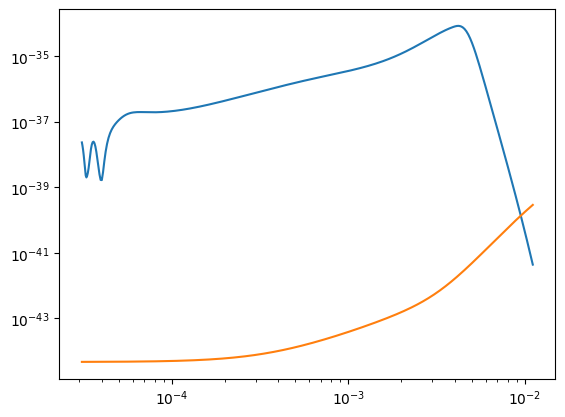

In [86]:
plt.loglog(freq, np.abs(A_full)**2)
plt.loglog(freq, Npsd)

Set up noiseless Afull, Efull

In [135]:
Afull = A_full
Efull = E_full

Compute SNR before running MCMC

In [136]:
snr_a = (4.0*df) * np.sum(np.abs(Afull)**2/Npsd)
print("Computed Noiseless SNR is " + str(np.sqrt(float(snr_a))))

Computed Noiseless SNR is 58.04450127476822


In [89]:
#now we set things up for mcmc
#solving for chirpmass and ratio
m1 = pMBHB['m1']
m2 = pMBHB['m2']
q = m1/m2
Mc = (m1+m2)*(q/(1+q)**2)**0.6

src0 = pMBHB.copy()
src0.pop("m1"); src0.pop("m2")
src0["Mchirp"] = Mc
src0["q"] = q
src0['psi'] += np.pi
src0['phi'] -= np.pi

keys = src0.keys()

#create the array to be altered in likelihood
src = copy.deepcopy(src0)

In [90]:
##change the likelihood function
def likelihood(params):
    src={k: v for k,v in zip(keys,params)}

    tdisignal = lisa.GenerateLISATDISignal_SMBH(src,
                                                gridfreq=freq,
                                                **waveform_params_smbh)
    mbh_lb = tdisignal['tdi'][(2,2)]

    A_trial = np.conjugate((mbh_lb['amp_real_chan1'] + 1.j*mbh_lb['amp_imag_chan1'])*np.exp(1j* mbh_lb['phase']))
    E_trial = np.conjugate((mbh_lb['amp_real_chan2'] + 1.j*mbh_lb['amp_imag_chan2'])*np.exp(1j* mbh_lb['phase']))

    SN_m = 4.0*df*np.sum(np.real(Afull*np.conjugate(A_trial))/Npsd) + 4.0*df*np.sum(np.real(Efull*np.conjugate(E_trial))/Npsd)

    XX = 4*df*np.sum(np.abs(A_trial)**2/Npsd) + 4*df*np.sum(np.abs(E_trial)**2/Npsd)

    loglik = SN_m - 0.5*XX
    return loglik

In [91]:
print(pMBHB)
print(pMBHB_snr)

{'beta': np.float64(0.9170307528208983), 'lambda': np.float64(-0.9033416315858802), 'chi1': np.float64(-0.09384532089744416), 'chi2': np.float64(-0.486710974346455), 'm1': np.float64(1856420.28713), 'm2': np.float64(1801541.22385), 'Deltat': np.float64(16532191.547870105), 'phi': np.float64(1.8660570584753848), 'dist': np.float64(43010.925050110134), 'psi': np.float64(-3.1296719957618815), 'inc': np.float64(1.7829208370729992)}
{np.str_('EclipticLatitude'): np.float64(0.9170307528208983), np.str_('EclipticLongitude'): np.float64(-0.9033416315858802), np.str_('PolarAngleOfSpin1'): np.float64(1.6658498049021284), np.str_('PolarAngleOfSpin2'): np.float64(2.092903155833516), np.str_('Spin1'): np.float64(0.988778), np.str_('Spin2'): np.float64(0.975945), np.str_('Mass1'): np.float64(1856420.28713), np.str_('Mass2'): np.float64(1801541.22385), np.str_('CoalescenceTime'): np.float64(16532191.547870105), np.str_('PhaseAtCoalescence'): np.float64(1.8660570584753848), np.str_('InitialPolarAngleL

In [92]:
day_sec = 86400

priors = {"mbh": ProbDistContainer({
    0: uniform_dist(-np.pi/2, np.pi/2), #lambda
    1: uniform_dist(-np.pi, np.pi), #beta
    2: uniform_dist(-1, 1), #chi1
    3: uniform_dist(-1, 1), #chi2
    4: uniform_dist(1*day_sec, 250*day_sec), #deltat
    5: uniform_dist(-np.pi, np.pi), #phi
    6: uniform_dist(2000.0, 2000000.0), #dist 
    7: uniform_dist(0., np.pi), #psi
    8: uniform_dist(0., np.pi), #inc
    9: uniform_dist(1e4, 1e7), #mchirp
    10: uniform_dist(1, 30), #q
})}

ndims = {"mbh": 11}

In [108]:
ntemps = 5
nwalkers = 22
nsamples = 50000

In [109]:
theta0 = np.array([[np.hstack(
          (np.random.randn(ndims["mbh"]) * 1e-8) + np.array(list(src0.values())))
          for i in range(nwalkers)]
          for _ in range(ntemps)])

start_state = State({"mbh": theta0})

In [110]:
sampler = EnsembleSampler(
    nwalkers,
    ndims,
    likelihood,
    priors,
    args=(),
    branch_names=["mbh"],
    tempering_kwargs=dict(ntemps=ntemps),
    nleaves_max=dict(mbh=1),
)

In [111]:
sampler.run_mcmc(start_state, nsamples, progress=True)

100%|██████████| 50000/50000 [35:31<00:00, 23.46it/s]


Time to Plot

In [103]:
#define truths
keys = src0.keys()
labels = list(keys)

inj=np.array(list(src0.values()))

truths = inj.flatten()
labels_final = labels

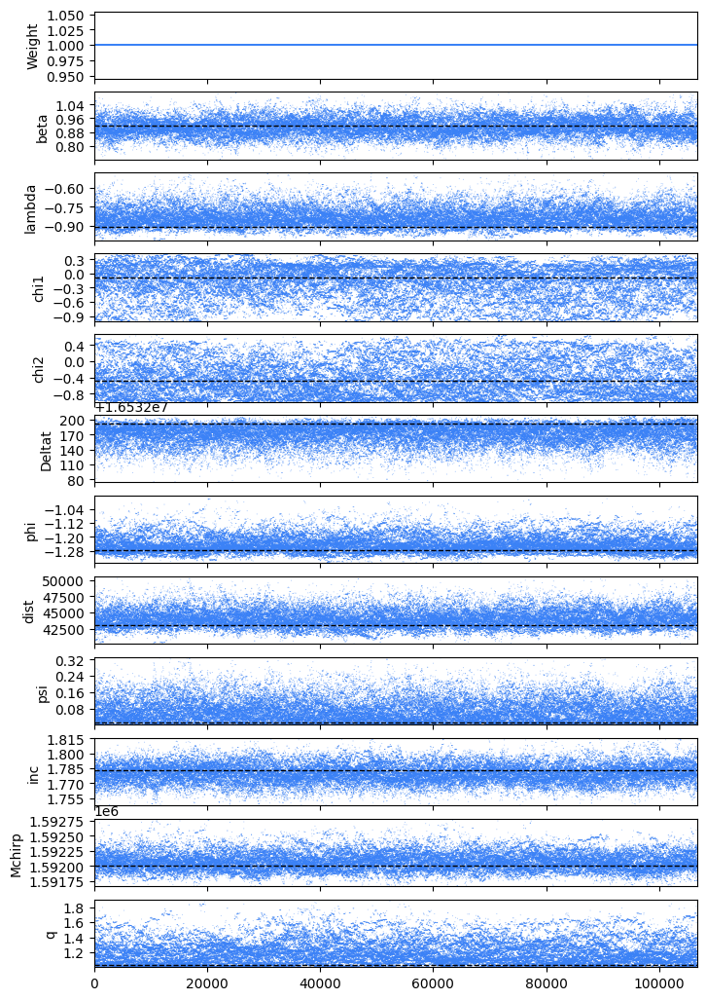

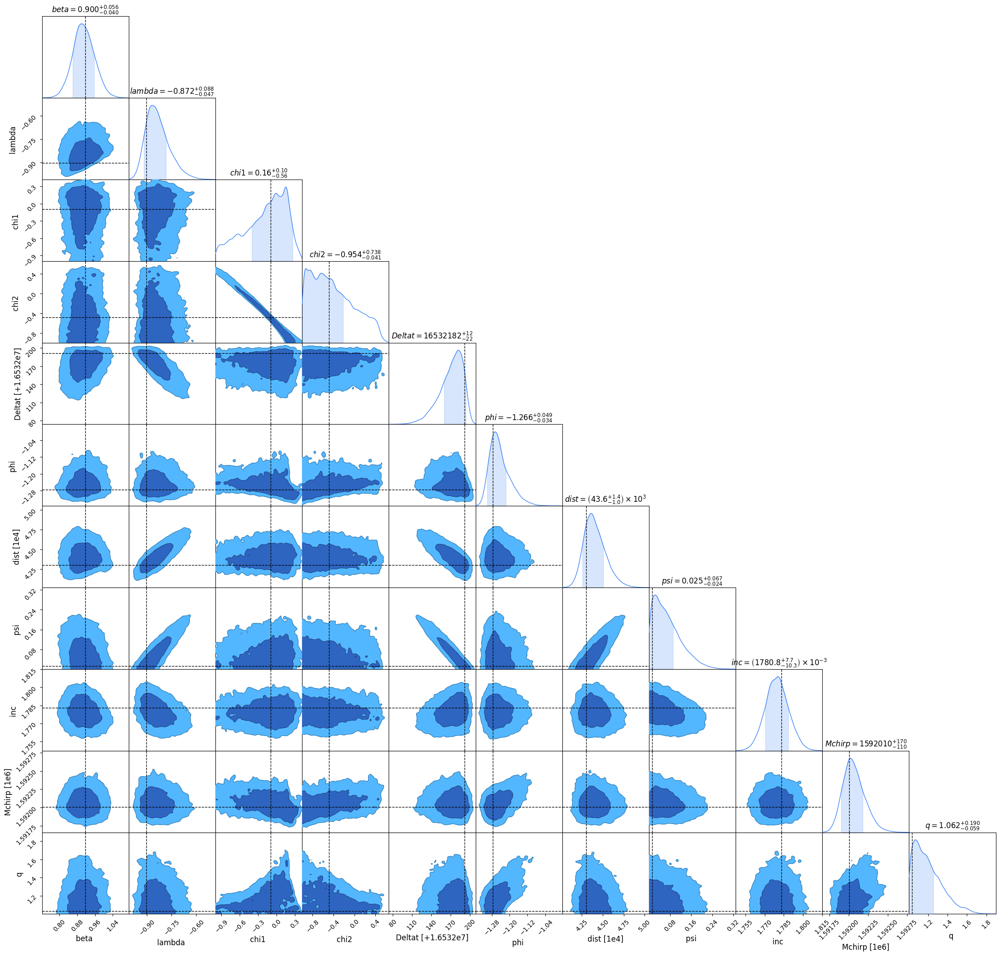

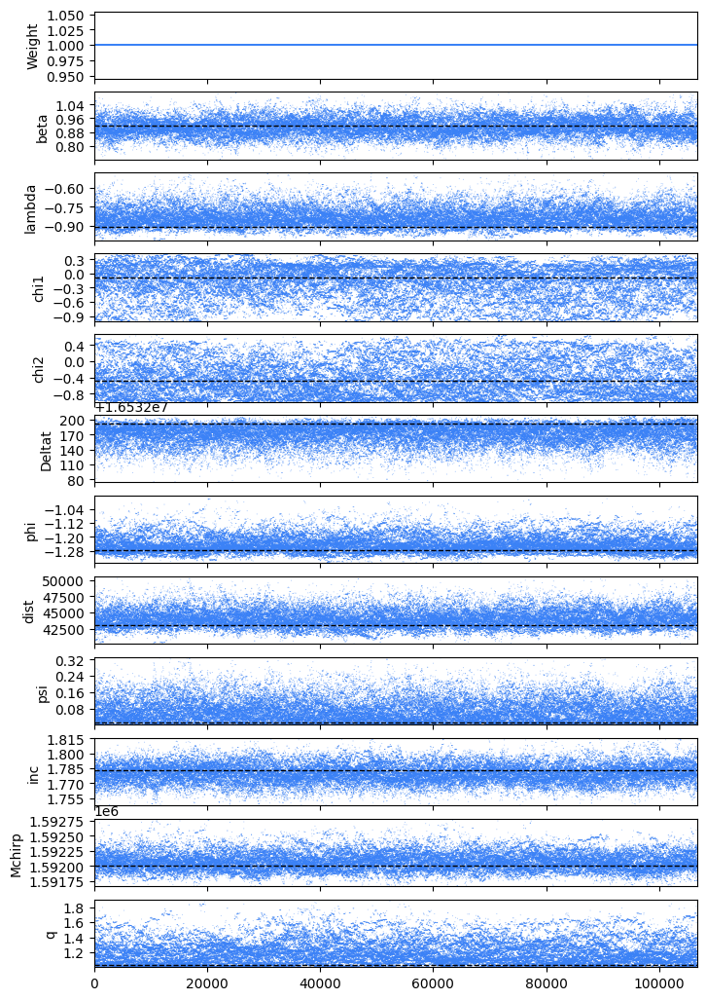

In [112]:
c = ChainConsumer()

samples_2ch = sampler.get_chain()["mbh"][:, 0].reshape(-1, 11)

burn = 140000
dfs_2chnls = pd.DataFrame(samples_2ch[burn:, :], columns = keys)

c.add_chain(Chain(samples=dfs_2chnls, name="noiseless", color="blue"))
c.add_truth(Truth(location={k:v for (k,v) in zip(labels_final,truths)}))

c.plotter.plot()
c.plotter.plot_walks()

In [132]:
csv_filename_0mm = "0mm_low_snr_chains.csv"
dfs_2chnls.to_csv(csv_filename_0mm, index=False)
print(f"Chain data saved to {csv_filename_0mm}")

Chain data saved to 0mm_low_snr_chains.csv


Move on to 1mm

In [116]:
#generate noise psd for 1mm
psd_sqrt = 6e-11*(np.sin(2*freq/fstar)**2 + 1e-12)/2.5e9 #2.5e9 is armlength
#1mm eyeball -> 6e-11
#2mm eyeball -> 2e-10
#10mm eyeball -> 8e-10

#Add noise function
def randc(r):
    return r/np.sqrt(2)*(np.random.randn(*r.shape) + 1j*np.random.randn(*r.shape))

#create noise fft
noise_fft = randc(psd_sqrt)

In [117]:
#add noisy noise to signal
Afull = A_full+ noise_fft/np.sqrt(df*4)
Efull = E_full+ noise_fft/np.sqrt(df*4)

In [118]:
snr_a = (4.0*df) * np.sum(np.abs(Afull)**2/Npsd)
print("Computed 1mm SNR is " + str(np.sqrt(float(snr_a))))

Computed 1mm SNR is 63.38141287722123


In [119]:
sampler2 = EnsembleSampler(
    nwalkers,
    ndims,
    likelihood,
    priors,
    args=(),
    branch_names=["mbh"],
    tempering_kwargs=dict(ntemps=ntemps),
    nleaves_max=dict(mbh=1),
)

In [120]:
sampler2.run_mcmc(start_state, nsamples, progress=True)

100%|██████████| 50000/50000 [35:39<00:00, 23.37it/s]  


Parameter chi1 in chain 1mm is not constrained


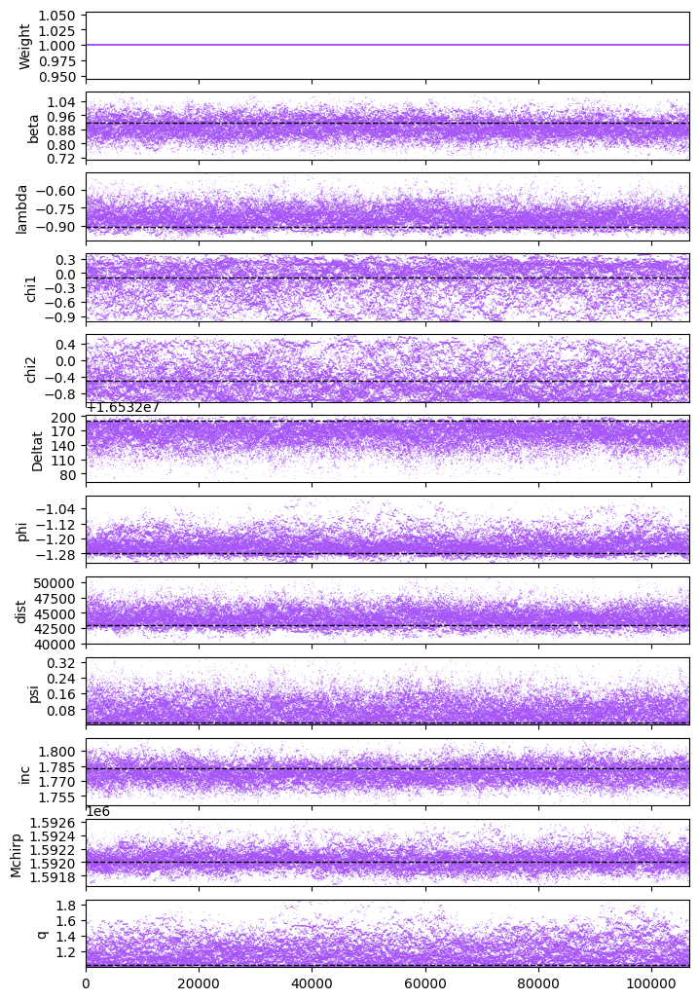

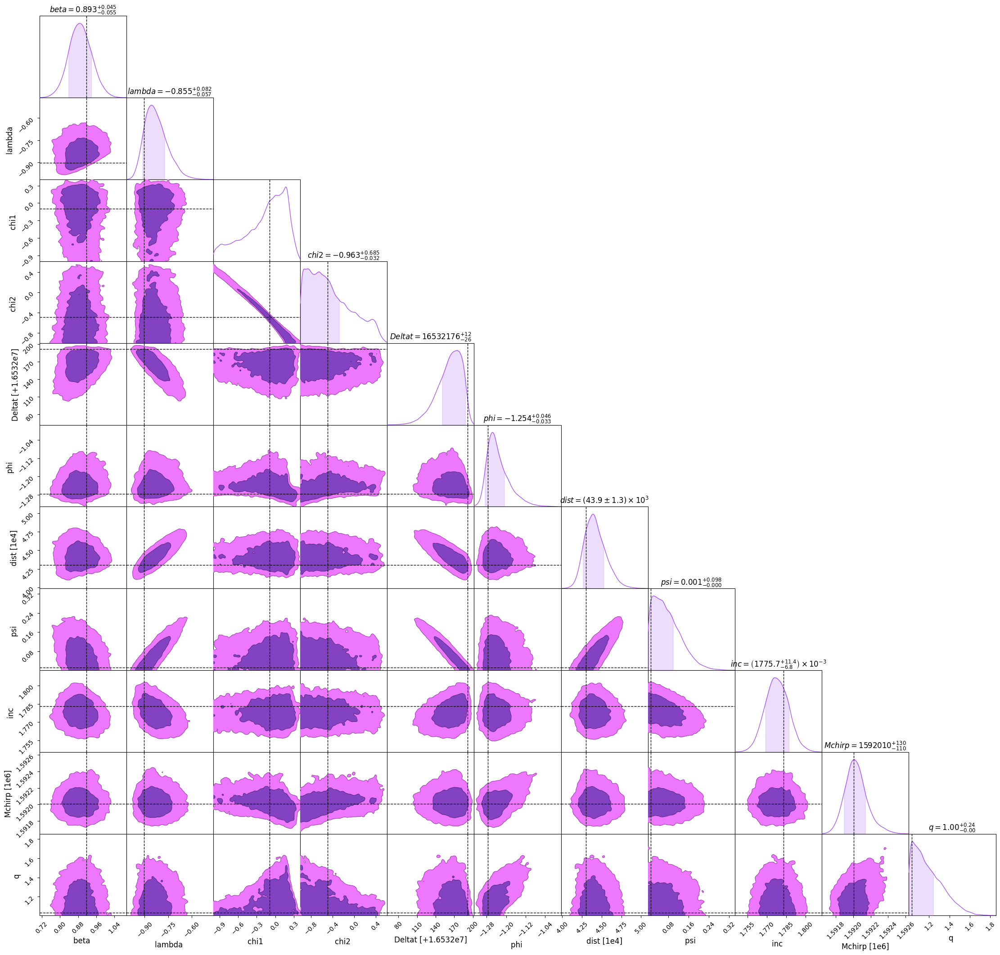

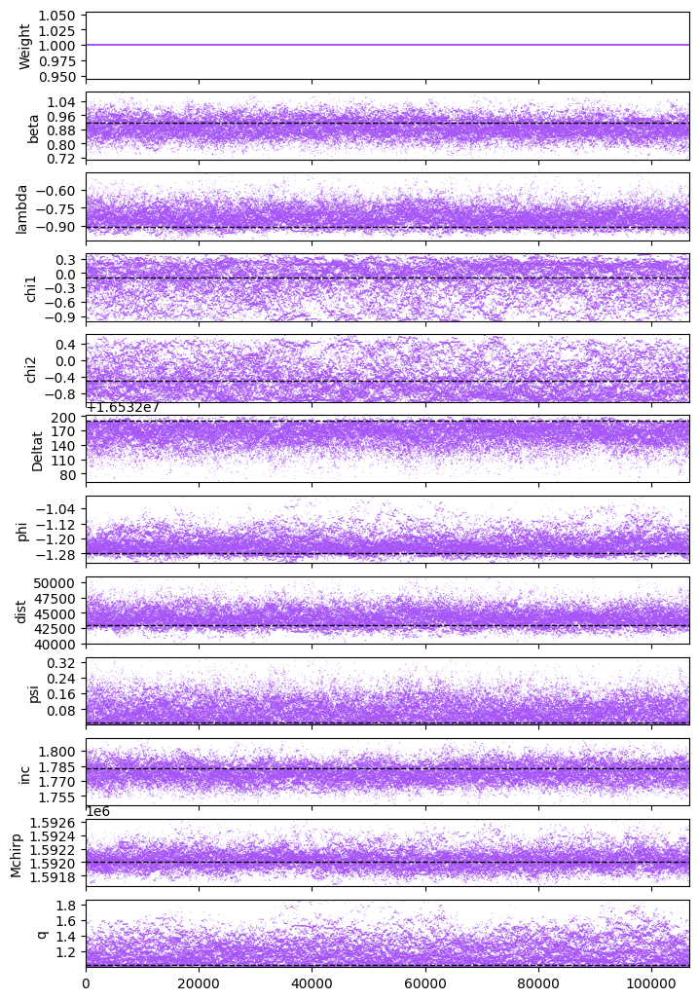

In [121]:
a = ChainConsumer()

one_samples = sampler2.get_chain()["mbh"][:, 0].reshape(-1, 11)

burn = 140000
one_samp= pd.DataFrame(one_samples[burn:, :], columns = keys)

a.add_chain(Chain(samples=one_samp, name="1mm", color="purple"))
a.add_truth(Truth(location={k:v for (k,v) in zip(labels_final,truths)}))

a.plotter.plot()
a.plotter.plot_walks()

In [128]:
csv_filename_1mm = "1mm_low_snr_chains.csv"
one_samp.to_csv(csv_filename_1mm, index=False)
print(f"Chain data saved to {csv_filename_1mm}")

Chain data saved to 1mm_low_snr_chains.csv


# 2mm noise

In [122]:
#generate noise psd for 1mm
psd_sqrt = 2e-10*(np.sin(2*freq/fstar)**2 + 1e-12)/2.5e9 #2.5e9 is armlength
#1mm eyeball -> 6e-11
#2mm eyeball -> 2e-10
#10mm eyeball -> 8e-10


noise_fft = randc(psd_sqrt)

#add noisy noise to signal
Afull = A_full+ noise_fft/np.sqrt(df*4)
Efull = E_full+ noise_fft/np.sqrt(df*4)

In [123]:
snr_a = (4.0*df) * np.sum(np.abs(Afull)**2/Npsd)
print("Computed 2mm SNR is " + str(np.sqrt(float(snr_a))))

Computed 2mm SNR is 104.89332432954494


In [124]:
sampler3 = EnsembleSampler(
    nwalkers,
    ndims,
    likelihood,
    priors,
    args=(),
    branch_names=["mbh"],
    tempering_kwargs=dict(ntemps=ntemps),
    nleaves_max=dict(mbh=1),
)

In [125]:
sampler3.run_mcmc(start_state, nsamples, progress=True)

100%|██████████| 50000/50000 [34:57<00:00, 23.84it/s]


Parameter chi1 in chain 2mm is not constrained


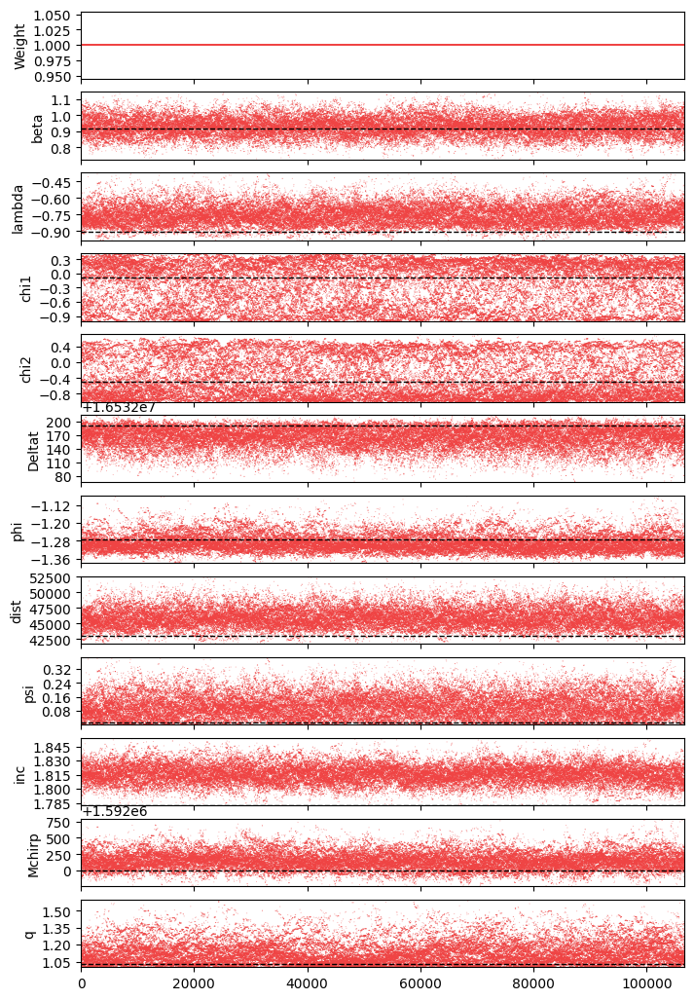

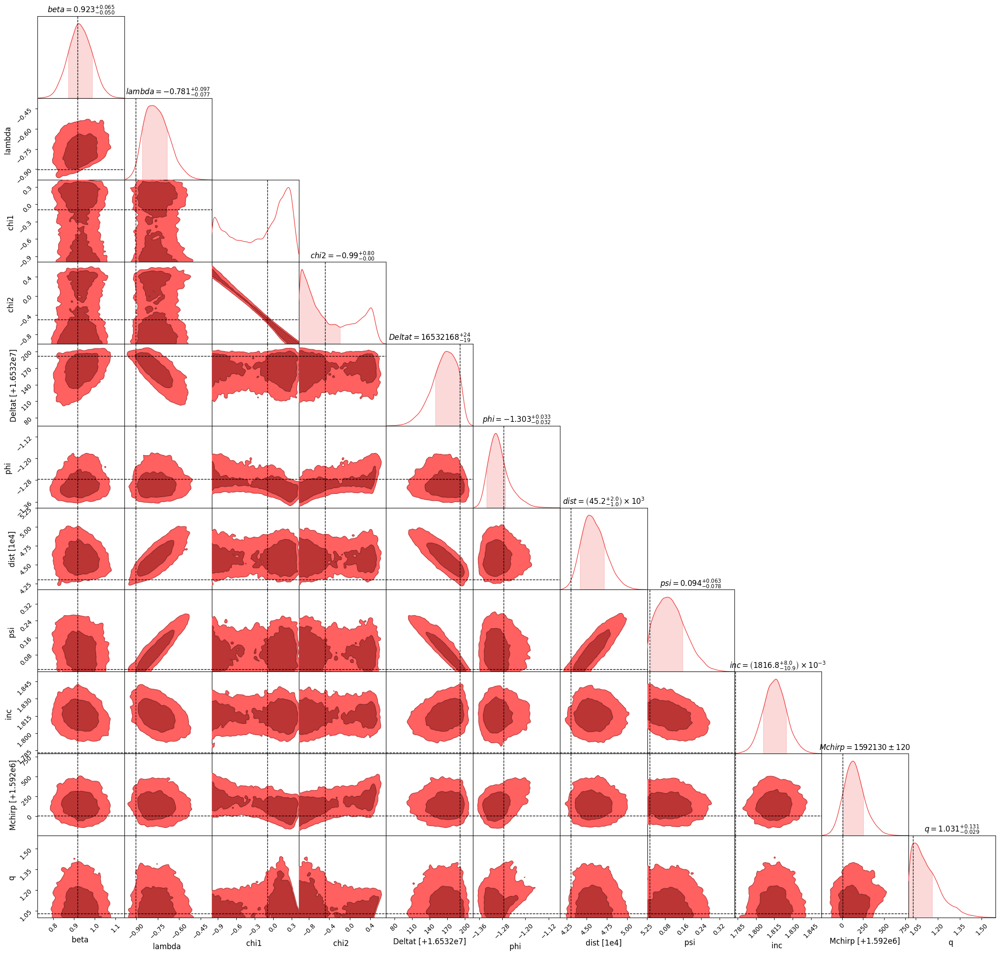

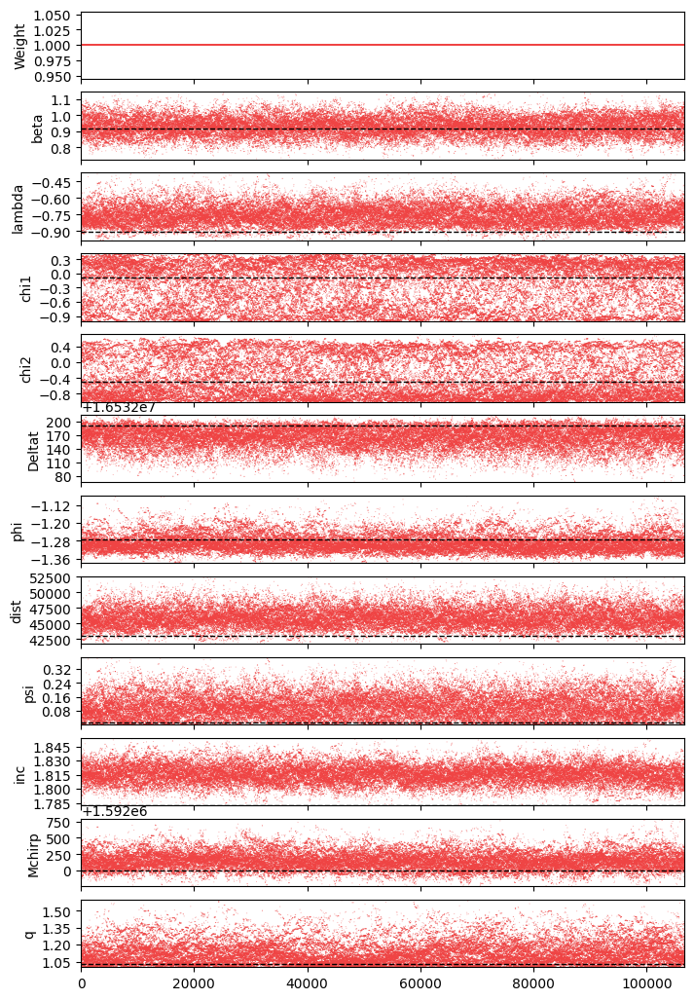

In [126]:
b = ChainConsumer()

two_samples = sampler3.get_chain()["mbh"][:, 0].reshape(-1, 11)

burn = 140000
two_samp= pd.DataFrame(two_samples[burn:, :], columns = keys)

b.add_chain(Chain(samples=two_samp, name="2mm", color="red"))
b.add_truth(Truth(location={k:v for (k,v) in zip(labels_final,truths)}))

b.plotter.plot()
b.plotter.plot_walks()

In [131]:
csv_filename_2mm = "2mm_low_snr_chains.csv"
two_samp.to_csv(csv_filename_2mm, index=False)
print(f"Chain data saved to {csv_filename_2mm}")

Chain data saved to 2mm_low_snr_chains.csv


# 10mm noisi

In [137]:
#generate noise psd for 1mm
psd_sqrt = 8e-10*(np.sin(2*freq/fstar)**2 + 1e-12)/2.5e9 #2.5e9 is armlength
#1mm eyeball -> 6e-11
#2mm eyeball -> 2e-10
#10mm eyeball -> 8e-10

noise_fft = randc(psd_sqrt)

#add noisy noise to signal
Afull = A_full+ noise_fft/np.sqrt(df*4)
Efull = E_full+ noise_fft/np.sqrt(df*4)

In [138]:
snr_a = (4.0*df) * np.sum(np.abs(Afull)**2/Npsd)
print("Computed 10mm SNR is " + str(np.sqrt(float(snr_a))))

Computed 10mm SNR is 316.51288569845764


In [139]:
sampler4 = EnsembleSampler(
    nwalkers,
    ndims,
    likelihood,
    priors,
    args=(),
    branch_names=["mbh"],
    tempering_kwargs=dict(ntemps=ntemps),
    nleaves_max=dict(mbh=1),
)

In [140]:
sampler4.run_mcmc(start_state, nsamples, progress=True)

100%|██████████| 50000/50000 [34:33<00:00, 24.12it/s] 


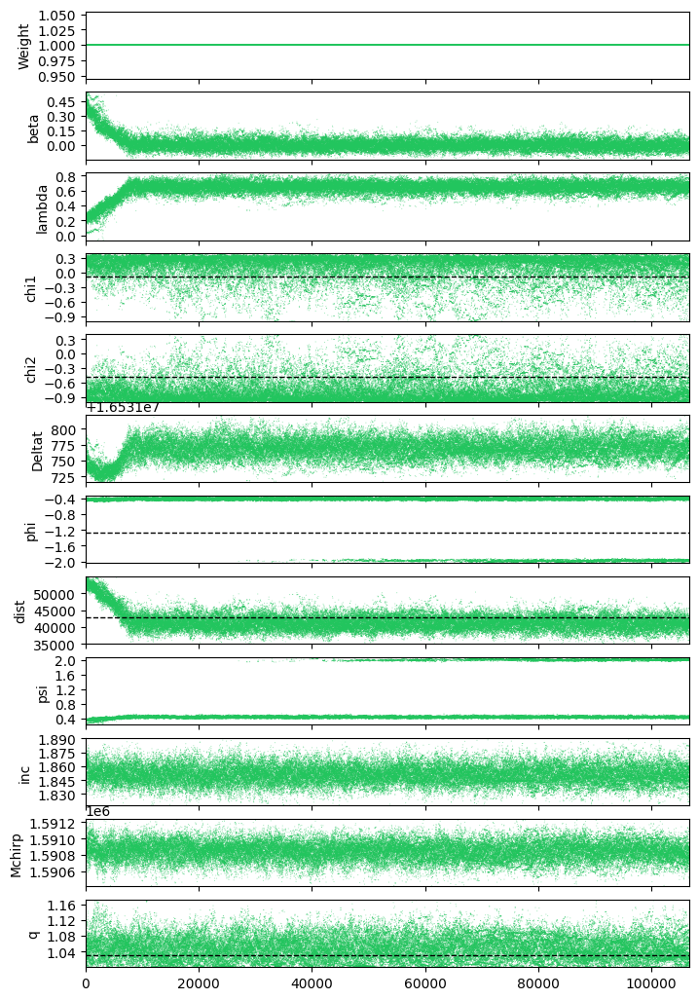

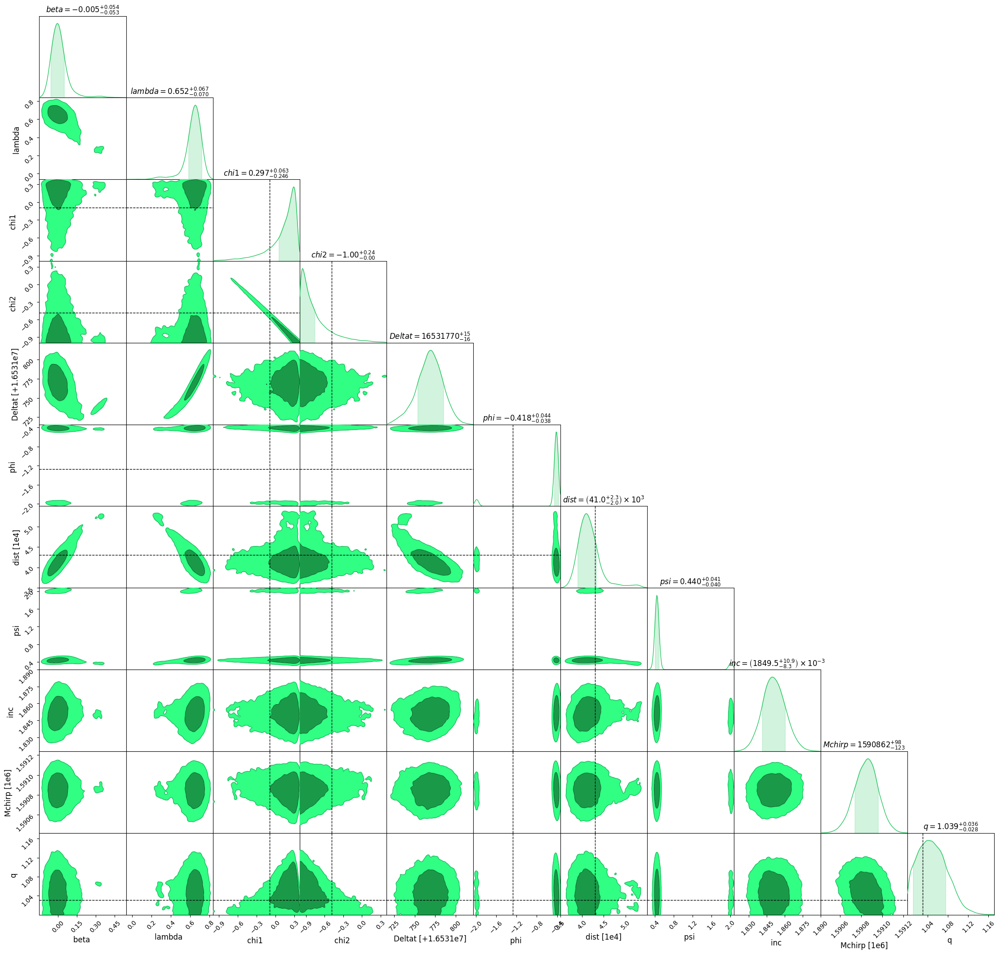

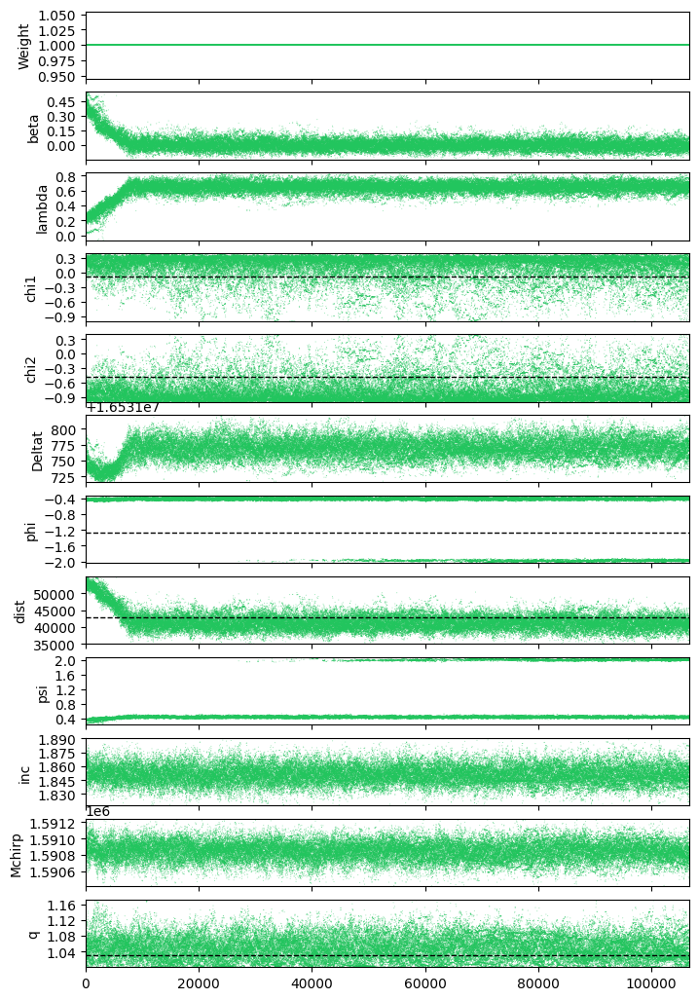

In [141]:
d = ChainConsumer()
ten_samples = sampler4.get_chain()["mbh"][:, 0].reshape(-1, 11)

burn = 140000
ten_samp= pd.DataFrame(ten_samples[burn:, :], columns = keys)

d.add_chain(Chain(samples=ten_samp, name="10mm", color="green"))
d.add_truth(Truth(location={k:v for (k,v) in zip(labels_final,truths)}))

d.plotter.plot()
d.plotter.plot_walks()

In [142]:
csv_filename_10mm = "10mm_low_snr_chains.csv"
two_samp.to_csv(csv_filename_10mm, index=False)
print(f"Chain data saved to {csv_filename_10mm}")

Chain data saved to 10mm_low_snr_chains.csv


# plot them all

Parameter chi1 in chain 1mm is not constrained
Parameter chi1 in chain 2mm is not constrained


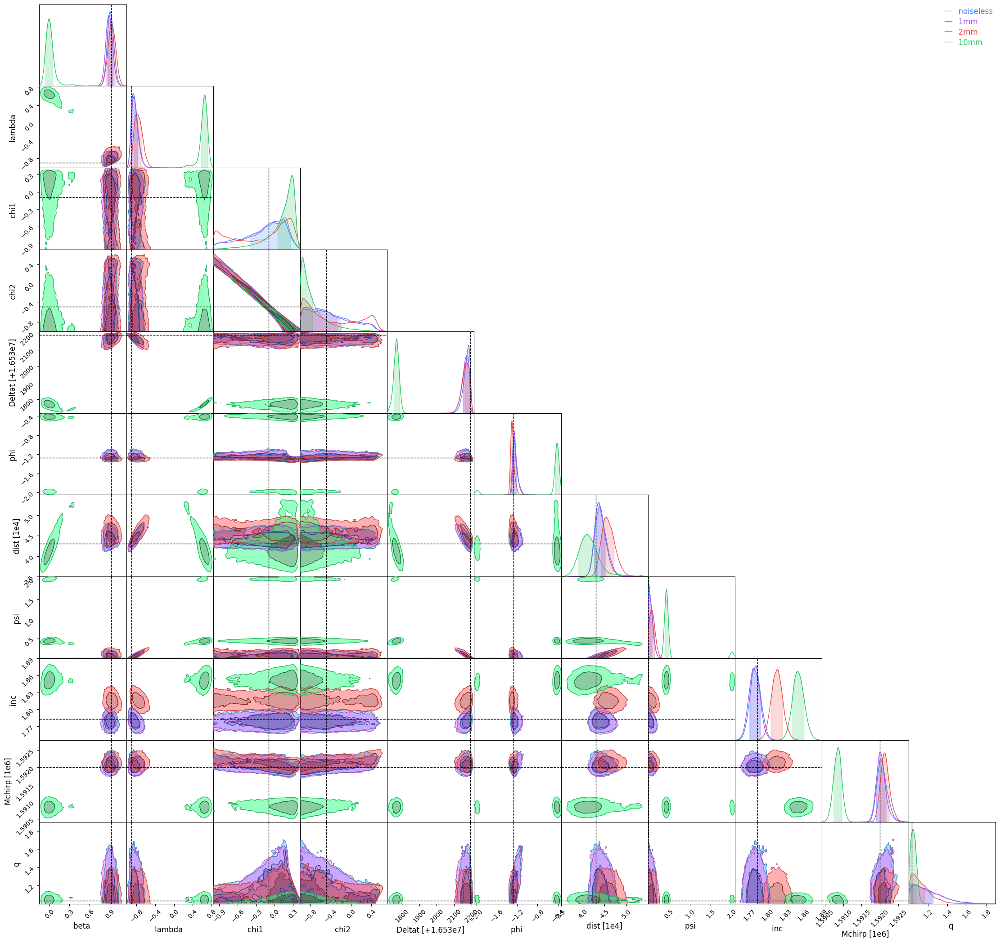

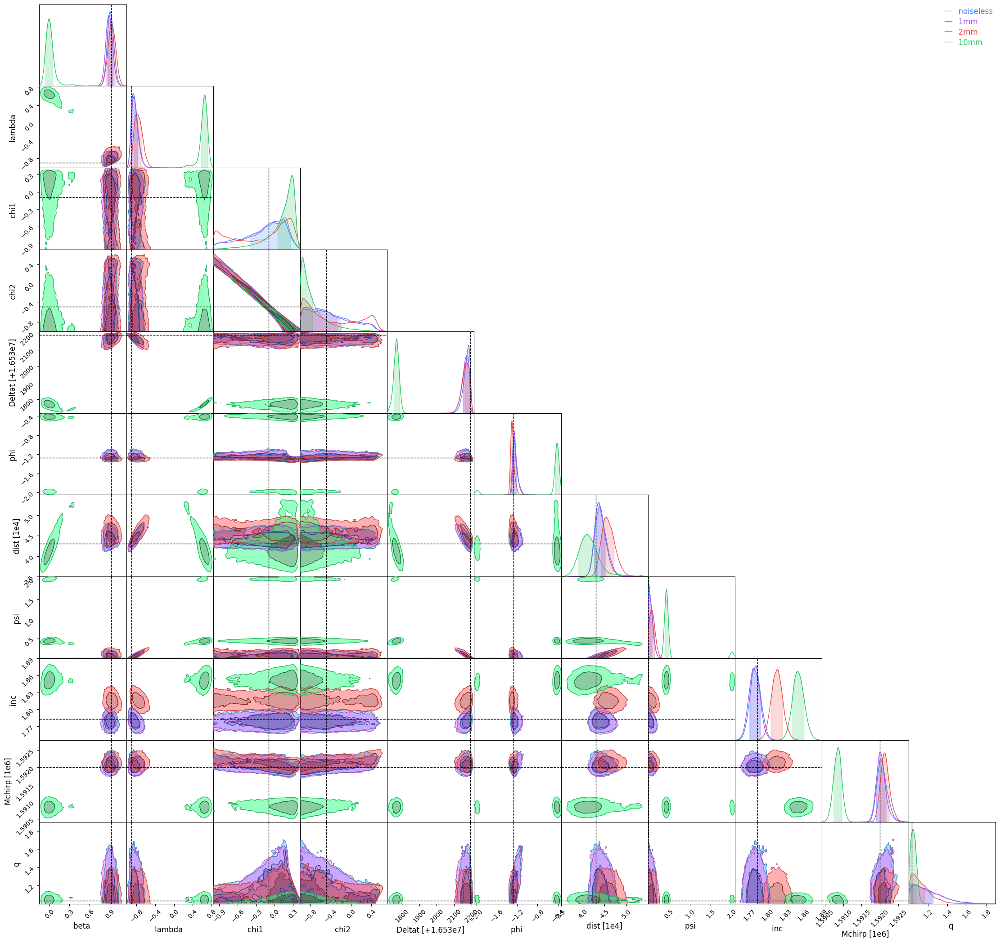

In [143]:
check2 = ChainConsumer()

check2.add_chain(Chain(samples=dfs_2chnls, name="noiseless", color="blue"))
check2.add_chain(Chain(samples=one_samp, name="1mm", color="purple"))
check2.add_chain(Chain(samples=two_samp, name="2mm", color="red"))
check2.add_truth(Truth(location={k:v for (k,v) in zip(labels_final,truths)}))

check2.add_chain(Chain(samples=ten_samp, name="10mm", color="green"))
check2.plotter.plot()